In [5]:
import cv2 as cv
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import tqdm
from numba import jit

## Results

We can see that lucas kanade tracker is working good but have some problems related to drifting window after some time. Window starts moving from the center of the object to the border and doesn't catch full object. I think applying some detection algorithm (for example neural networks) to calibrate tracker could provide a lot of improvement. Also, you rarely need to run detection and can do that once per 100-200 frames. 

Unfortunately, due to lack of time I haven't implemented lucas kanade from scratch and haven't implemented both versions as stated by task

In [6]:
BLUR_BODY_DATA_PATH = "data/BlurBody" 
IRONMAN_DATA_PATH = "data/Ironman" 
DOG_DATA_PATH = "data/Dog" 
SURFER_DATA_PATH = "data/Surfer" 
WALKING_DATA_PATH = "data/Walking" 


In [7]:
def read_data(data_path, sep='\t'):
    boxes = pd.read_csv(f"{data_path}/groundtruth_rect.txt", sep=sep, header=None)
    frames = list(sorted(os.listdir(f"{data_path}/img/")))
    return frames, boxes 

In [14]:
DATA_PATH = BLUR_BODY_DATA_PATH
frames, boxes = read_data(DATA_PATH)

In [18]:
frame = cv.imread(f"{DATA_PATH}/img/{frames[0]}")
x, y, w, h = boxes.iloc[0]

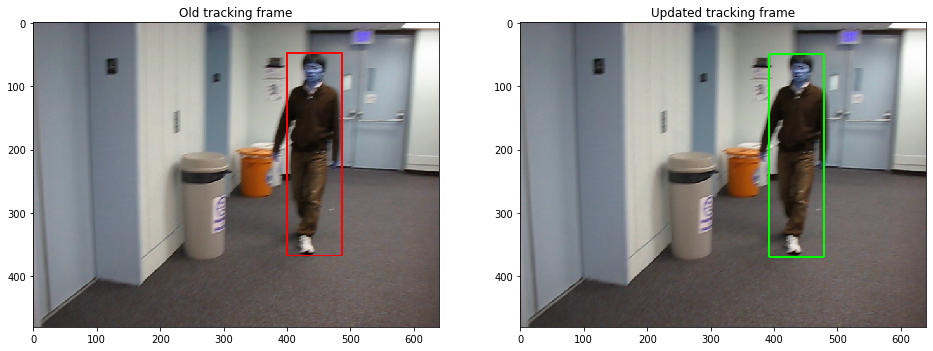

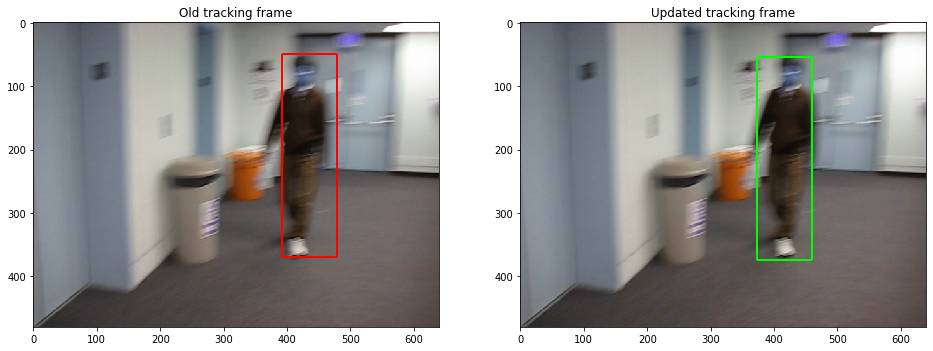

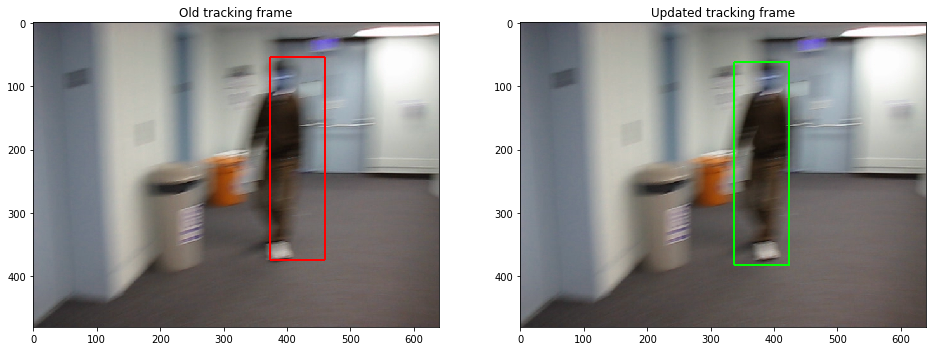

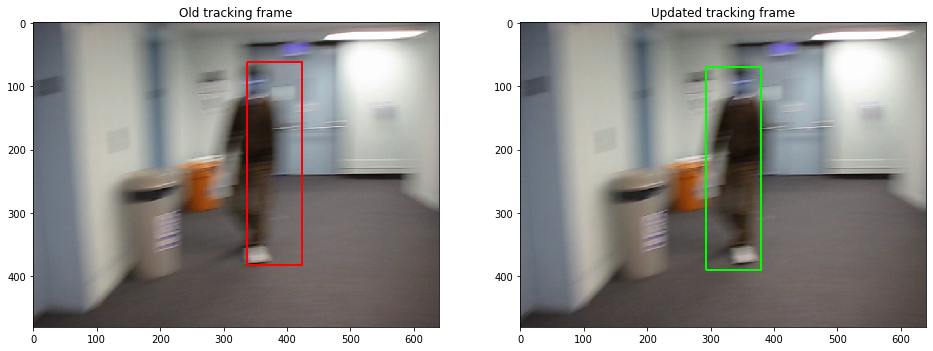

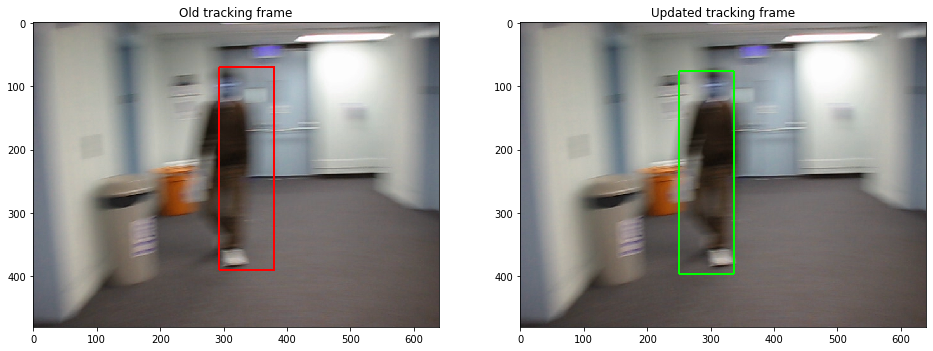

...

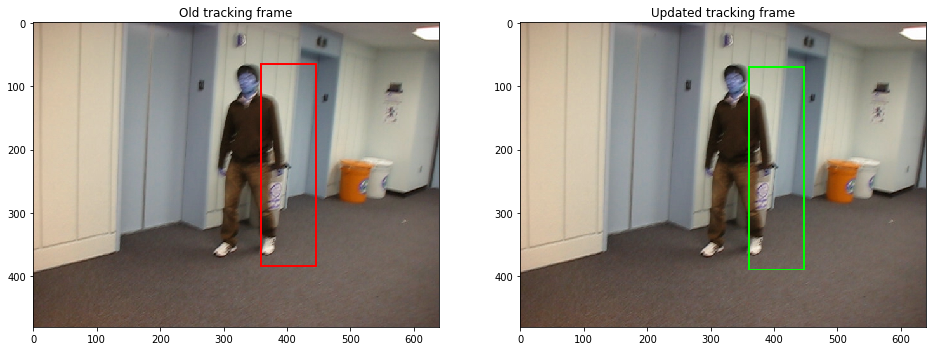

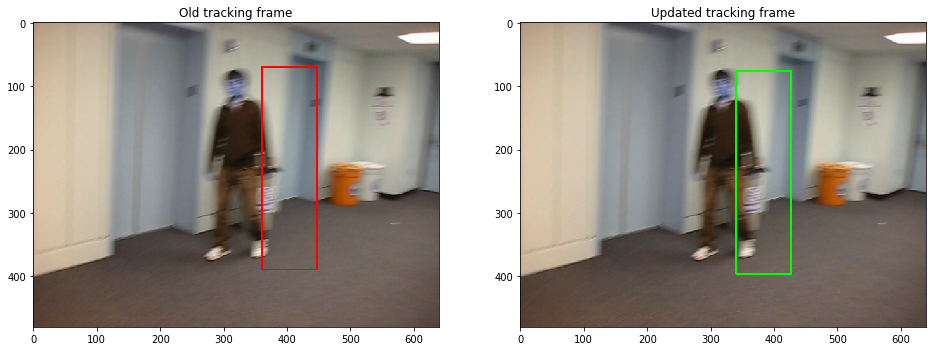

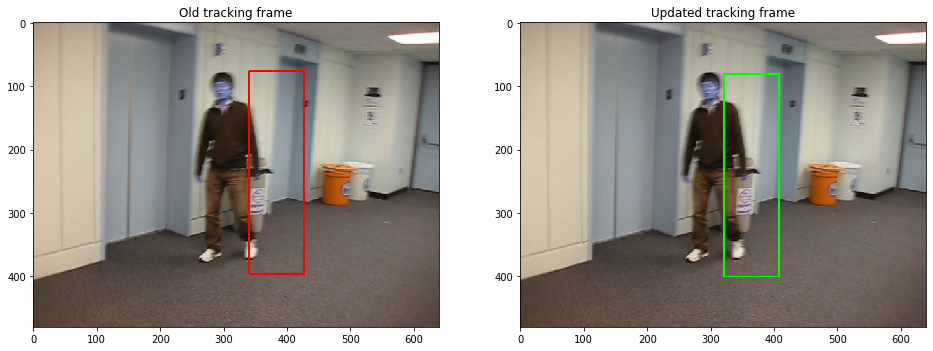

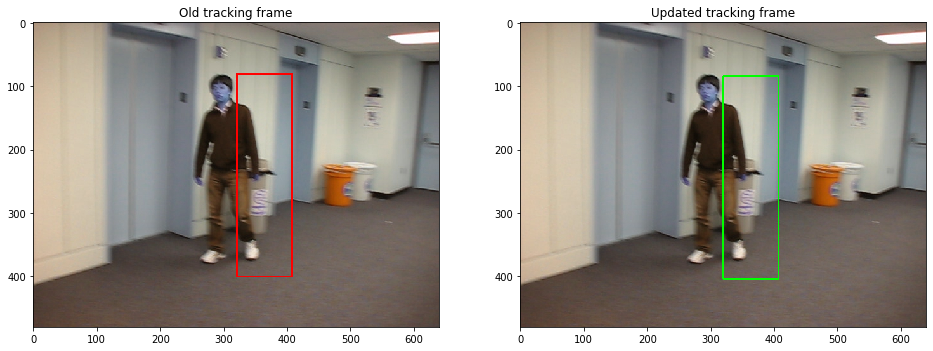

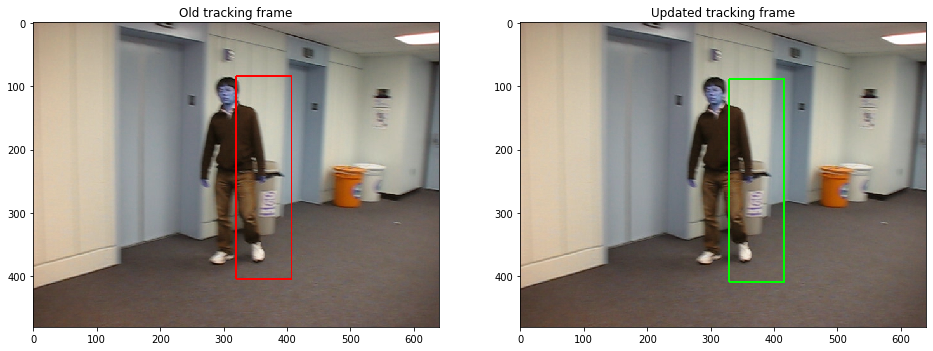

In [19]:
old_gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
# Lucas kanade params
lk_params = dict(winSize = (50, 50),
                 maxLevel = 4,
                 criteria = (cv.TERM_CRITERIA_EPS | cv.TERM_CRITERIA_COUNT, 10, 0.03))
point = (x, y)
point_selected = True
old_points = np.array([[x, y]], dtype=np.float32)        
for i in range(1, 80):
    frame = cv.imread(f"{DATA_PATH}/img/{frames[i]}")
    gray_frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
    if point_selected is True:
        old = cv.rectangle(frame.copy(), (x, y), (x+w, y+h), (255, 0, 0), 2)
        new_points, status, error = cv.calcOpticalFlowPyrLK(old_gray, gray_frame, old_points, None, **lk_params)
        old_gray = gray_frame.copy()
        old_points = new_points
        new_points = new_points.astype(int)
        x, y = new_points.ravel()
        new = cv.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)
    
    plt.figure(figsize=(16, 8))
    plt.subplot(1, 2, 1)
    plt.title("Old tracking frame")
    plt.imshow(old)
    plt.subplot(1, 2, 2)
    plt.title("Updated tracking frame")
    plt.imshow(new)
    plt.show()
